# Data anaysis

In [1]:
# load data from previously processed data

import numpy as np
import pandas as pd

df_data = pd.read_csv('data1019.csv')
df_data.head()

,CMPLNT_NUM,CMPLNT_DATE,CMPLNT_YEAR,CMPLNT_MONTH,OFNS_DESC,BORO_NM,Latitude,Longitude
0,408450072,2012-01-02,2012,1,OFF. AGNST PUB ORD SENSBLTY &,BROOKLYN,40.597121,-73.941249
1,114547452,2012-01-02,2012,1,BURGLARY,QUEENS,40.762102,-73.820334
2,579666649,2012-01-02,2012,1,ARSON,BRONX,40.851316,-73.902117
3,228510203,2012-01-02,2012,1,PETIT LARCENY,QUEENS,40.709501,-73.786483
4,329522444,2012-01-02,2012,1,BURGLARY,BROOKLYN,40.668598,-73.889725


## Question 1. What are the most common crime types? Which borough had the most crime number?

In [2]:
crime_group_df = pd.DataFrame({'Number of Crime': df_data.groupby(['OFNS_DESC']).size()}).reset_index()
df_data['OFNS_DESC'].value_counts()

PETIT LARCENY                      676860
HARRASSMENT 2                      514354
ASSAULT 3 & RELATED OFFENSES       424031
CRIMINAL MISCHIEF & RELATED OF     380670
GRAND LARCENY                      352753
                                    ...  
FORTUNE TELLING                         4
KIDNAPPING AND RELATED OFFENSES         3
OFFENSES AGAINST MARRIAGE UNCL          2
UNDER THE INFLUENCE OF DRUGS            2
LOITERING FOR DRUG PURPOSES             1
Name: OFNS_DESC, Length: 70, dtype: int64

__Let's visualize it!__

<AxesSubplot:xlabel='OFNS_DESC'>

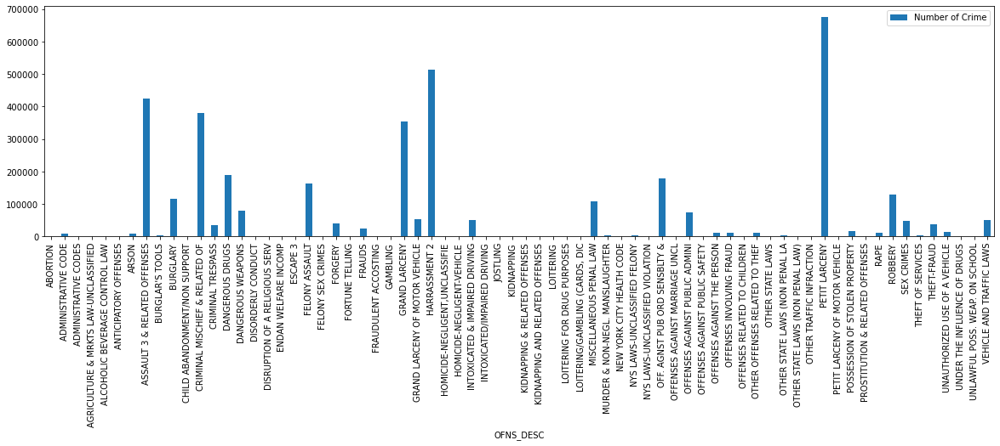

In [3]:
# Bar chart that shows the amount of crime since year 2012
crime_group_df.plot(kind='bar', x='OFNS_DESC', y='Number of Crime', figsize=(20,5))

<AxesSubplot:xlabel='CMPLNT_YEAR'>

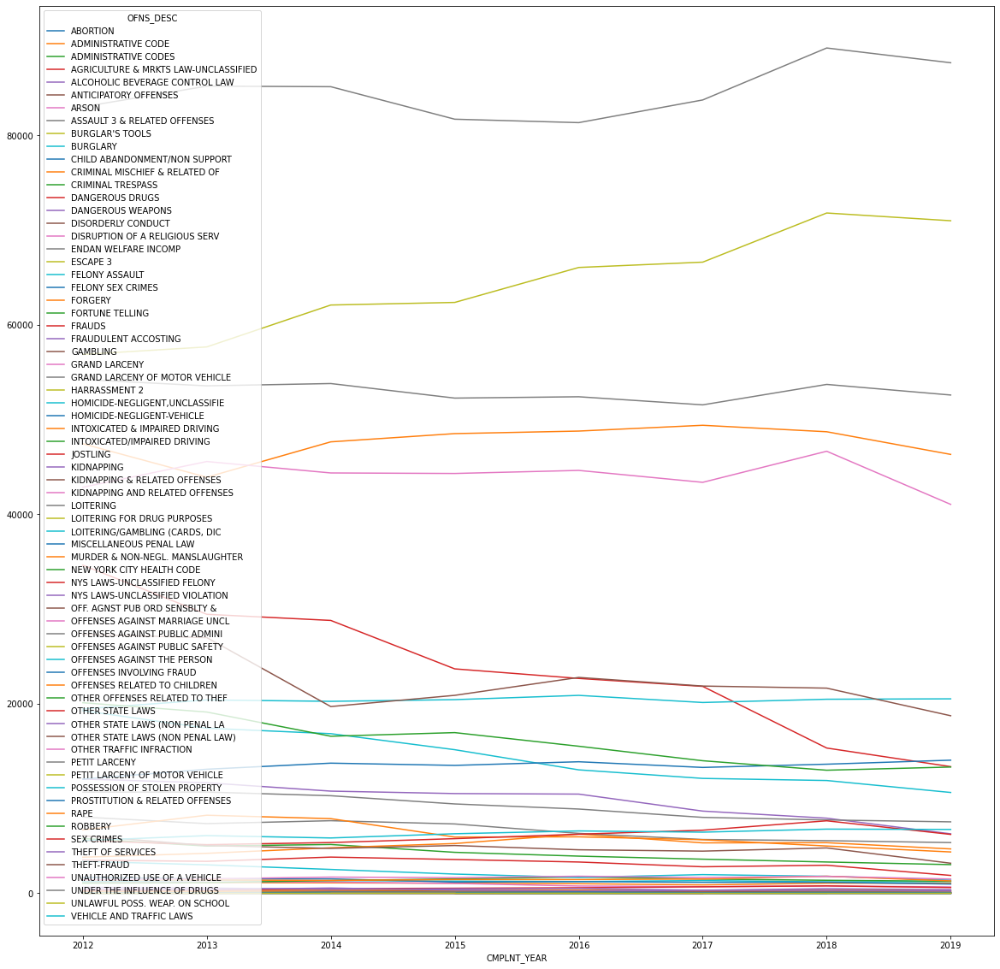

In [4]:
# Line fig that shows the amount and trend of each type of crime since the year 2012
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(20, 20))
df_data.groupby(['CMPLNT_YEAR', 'OFNS_DESC']).count()['CMPLNT_NUM'].unstack().plot(ax=ax)

__Let's find out which borough has the most number of crimes__

In [5]:
# most often borough
borough_top_2012 = pd.DataFrame({'count': df_data.groupby(['BORO_NM']).size()}).reset_index()
borough_top_2012.sort_values('count', ascending=False, inplace=True)
borough_top_2012

,BORO_NM,count
1,BROOKLYN,1144279
2,MANHATTAN,926791
0,BRONX,833774
3,QUEENS,764509
4,STATEN ISLAND,174446


---__Q1 ANSWER: From the outcome we know that PETIT LARCENY is the most common crime type. And the top 5 crime types are PETIT LARCENY, HARRASSMENT 2, ASSAULT 3 & RELATED OFFENSES, CRIMINAL MISCHIEF & RELATED OF, and GRAND LARCENY.__

## Question 2. Did some of the efforts of the police system and the social education system work? What is the trend of crimes declined?

__Let's visualize the trend__

<AxesSubplot:xlabel='CMPLNT_YEAR'>

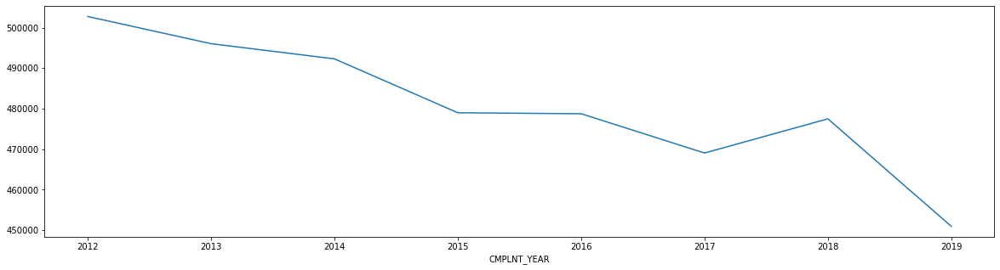

In [6]:
# by year
fig, ax = plt.subplots(figsize=(20, 5))
df_data.groupby(['CMPLNT_YEAR']).count()['CMPLNT_NUM'].plot(ax=ax)

<AxesSubplot:xlabel='CMPLNT_YEAR,CMPLNT_MONTH'>

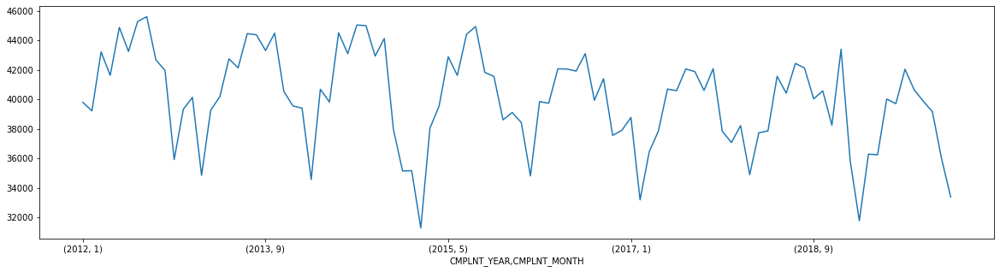

In [7]:
# by month
fig, ax = plt.subplots(figsize=(20, 5))
df_data.groupby(['CMPLNT_YEAR', 'CMPLNT_MONTH']).count()['CMPLNT_NUM'].plot(ax=ax)

---__Q2 ANSWER: The amount of crime is decreasing year by year! The efforts of the police system and the social education system works fine!__

## Question 3. What is the crime trend during a year? which month is the peak of crime?

__First, let's count the number since 2012__

In [8]:
# the total amount by month since 2012
crime_group_mon_df = pd.DataFrame({'Number of Crime': df_data.groupby(['CMPLNT_MONTH']).size()}).reset_index()
crime_group_mon_df.sort_values('Number of Crime', ascending=False, inplace=True)
crime_group_mon_df.reset_index(drop=True)

,CMPLNT_MONTH,Number of Crime
0,8,347684
1,7,347652
2,5,339394
3,10,335357
4,6,332877
5,9,331210
6,4,312878
7,3,311535
8,1,305770
9,12,304898


<AxesSubplot:xlabel='CMPLNT_MONTH', ylabel='Number of Crime'>

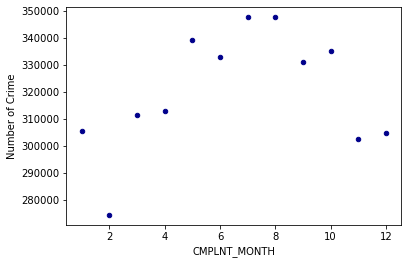

In [9]:
crime_group_mon_df.plot.scatter(x='CMPLNT_MONTH',
                      y='Number of Crime',
                      c='DarkBlue')

In [10]:
# the total amount by year and month since 2012
crime_group_mon_df2 = pd.DataFrame({'Number of Crime': df_data.groupby(['CMPLNT_YEAR','CMPLNT_MONTH']).size()}).reset_index()
crime_group_mon_df2.reset_index(drop=True)
crime_group_mon_df2.head()

,CMPLNT_YEAR,CMPLNT_MONTH,Number of Crime
0,2012,1,39802
1,2012,2,39218
2,2012,3,43220
3,2012,4,41631
4,2012,5,44882


<AxesSubplot:xlabel='CMPLNT_MONTH', ylabel='Number of Crime'>

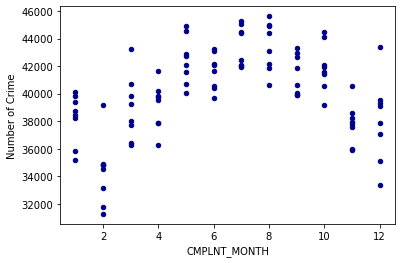

In [11]:
crime_group_mon_df2.plot.scatter(x='CMPLNT_MONTH',
                      y='Number of Crime',
                      c='DarkBlue')

__We can conclude from the data and figures that July and August have the most number of crime. Criminals are more active in summer days.__

__Then, let's focus on the most recent year 2019 for further analysis.__

In [12]:
# get the data of 2019
df_data_2019=df_data.loc[df_data['CMPLNT_YEAR'] == 2019]
df_data_2019.reset_index(drop=True)
df_data_2019.head()

,CMPLNT_NUM,CMPLNT_DATE,CMPLNT_YEAR,CMPLNT_MONTH,OFNS_DESC,BORO_NM,Latitude,Longitude
3395512,442809231,2019-01-01,2019,1,SEX CRIMES,BROOKLYN,40.674583,-73.930222
3395513,651750698,2019-01-01,2019,1,GRAND LARCENY,MANHATTAN,40.748831,-73.988478
3395514,394629573,2019-01-01,2019,1,CRIMINAL MISCHIEF & RELATED OF,BRONX,40.827820,-73.925931
3395515,967895740,2019-01-01,2019,1,HARRASSMENT 2,MANHATTAN,40.804384,-73.937422
3395516,293332550,2019-01-01,2019,1,HARRASSMENT 2,BRONX,40.901630,-73.896747


In [13]:
# most often offence type
type_top5 = pd.DataFrame({'count': df_data_2019.groupby(['OFNS_DESC']).size()})
type_top5.sort_values('count', ascending=False, inplace=True)
type_top5.head()

,count
OFNS_DESC,
PETIT LARCENY,87644
HARRASSMENT 2,70972
ASSAULT 3 & RELATED OFFENSES,52581
CRIMINAL MISCHIEF & RELATED OF,46314
GRAND LARCENY,41041


In [14]:
# most offten borough
borough_top = pd.DataFrame({'count': df_data_2019.groupby(['BORO_NM']).size()}).reset_index()
borough_top.sort_values('count', ascending=False, inplace=True)
borough_top

,BORO_NM,count
1,BROOKLYN,129370
2,MANHATTAN,113649
0,BRONX,99002
3,QUEENS,90146
4,STATEN ISLAND,18510


In [15]:
# the total amount by month of 2019
crime_group_mon_df_2019 = pd.DataFrame({'Number of Crime': df_data_2019.groupby(['CMPLNT_MONTH']).size()}).reset_index()
crime_group_mon_df_2019.sort_values('Number of Crime', ascending=False, inplace=True)
crime_group_mon_df_2019.reset_index(drop=True)

,CMPLNT_MONTH,Number of Crime
0,7,42045
1,8,40650
2,5,40022
3,9,39878
4,6,39708
5,10,39165
6,3,36284
7,4,36247
8,11,35981
9,1,35843


<AxesSubplot:xlabel='CMPLNT_MONTH', ylabel='Number of Crime'>

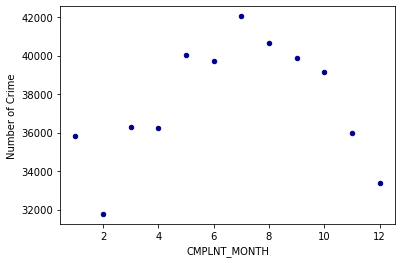

In [16]:
crime_group_mon_df_2019.plot.scatter(x='CMPLNT_MONTH',
                      y='Number of Crime',
                      c='DarkBlue')

__The 2019 data shows the same trend as history__

---__Q3 ANSWER: Through out the year, the crime has a curve trend. The peak is Jul and Aug, which is the busiest time of the police system.__

## Question 4. Which area has the most concentrated crime that needs special attention? Is this area related to it's economic prosperity?

__Use geopy library to get the latitude and longitude values of New York City.__

In [17]:
!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

Solving environment: done

# All requested packages already installed.



In [18]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


__import folium library to visualize the data on maps__

In [ ]:
! pip install folium==0.5.0
import folium # plotting library

In [20]:
borough_map = folium.Map(location=[40.7127281, -74.0060152], zoom_start=10.5, tiles='Stamen Toner')

__Due to the large amount of data, let's focus on Aug of 2019 to get the visualization__

In [21]:
# get the data of Aug, 2019
df_data_201908=df_data_2019.loc[df_data['CMPLNT_MONTH'] == 8]
df_data_201908.reset_index(drop=True)
df_data_201908.head()

,CMPLNT_NUM,CMPLNT_DATE,CMPLNT_YEAR,CMPLNT_MONTH,OFNS_DESC,BORO_NM,Latitude,Longitude
3657431,645757844,2019-08-01,2019,8,DANGEROUS WEAPONS,BRONX,40.840188,-73.926463
3657432,815573324,2019-08-01,2019,8,HARRASSMENT 2,BROOKLYN,40.664307,-73.869972
3657433,620131398,2019-08-01,2019,8,CRIMINAL MISCHIEF & RELATED OF,MANHATTAN,40.710229,-74.007746
3657434,831375149,2019-08-01,2019,8,OTHER OFFENSES RELATED TO THEF,BROOKLYN,40.676981,-73.937310
3657435,203426514,2019-08-01,2019,8,HARRASSMENT 2,BRONX,40.844884,-73.891583


__We cannot visualize all the cases due to the large amount, so we can cluster them for better visualization.__

In [ ]:
from folium.plugins import MarkerCluster
MarkerCluster()

marker_cluster = MarkerCluster().add_to(borough_map)

for lat, lon in zip(df_data_201908.Latitude, df_data_201908.Longitude):
    folium.Marker([lat, lon]).add_to(marker_cluster)
borough_map

__Define Foursquare Credentials and Version__

In [23]:
CLIENT_ID = 'YQ0X3FK5BEZZJ5VJXXTN0WMWV1E533RJMYHEW5NTAK5A5NUL' # your Foursquare ID
CLIENT_SECRET = 'IQDXGDSDBZVY1RGX2J3AZO3C2VTW2WLK05GREQZWW12QZ0TX' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: YQ0X3FK5BEZZJ5VJXXTN0WMWV1E533RJMYHEW5NTAK5A5NUL
CLIENT_SECRET:IQDXGDSDBZVY1RGX2J3AZO3C2VTW2WLK05GREQZWW12QZ0TX


__Search the whole city, get the top 100 venues.__

In [61]:
url = 'https://api.foursquare.com/v2/venues/search?near=New%20York,%20NY&client_id={}&client_secret={}&v={}&limit={}&categoryId=4d4b7105d754a06378d81259'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    LIMIT)
url

'https://api.foursquare.com/v2/venues/search?near=New%20York,%20NY&client_id=YQ0X3FK5BEZZJ5VJXXTN0WMWV1E533RJMYHEW5NTAK5A5NUL&client_secret=IQDXGDSDBZVY1RGX2J3AZO3C2VTW2WLK05GREQZWW12QZ0TX&v=20180605&limit=100&categoryId=4d4b7105d754a06378d81259'

In [ ]:
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
results = requests.get(url).json()
results

__Analize the results, get the location information.__

In [ ]:
df_results = pd.DataFrame(results['response']['venues'])
df_loc=df_results['location']
df_ll_array=np.asarray(df_loc)
df_ll_array

In [64]:
nearby_venues = json_normalize(df_ll_array) # flatten JSON
nearby_venues.head()

<ipython-input-64-3166e0eb3158>:1: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues = json_normalize(df_ll_array) # flatten JSON


,address,crossStreet,lat,lng,labeledLatLngs,postalCode,cc,city,state,country,formattedAddress,neighborhood
0,675 6th Ave,at W 21st St,40.741739,-73.993653,"[{'label': 'display', 'lat': 40.74173913980557...",10010,US,New York,NY,United States,"[675 6th Ave (at W 21st St), New York, NY 1001...",NaN
1,200 5th Ave,at W 23rd St,40.741987,-73.989913,"[{'label': 'display', 'lat': 40.74198696405861...",10010,US,New York,NY,United States,"[200 5th Ave (at W 23rd St), New York, NY 1001...",NaN
2,NaN,NaN,40.771785,-73.833839,"[{'label': 'display', 'lat': 40.77178493034232...",11356,US,College Point,NY,United States,"[College Point, NY 11356, United States]",NaN
3,767 5th Ave,btwn E 58th & E 59th St,40.763733,-73.972744,"[{'label': 'display', 'lat': 40.7637325, 'lng'...",10153,US,New York,NY,United States,"[767 5th Ave (btwn E 58th & E 59th St), New Yo...",NaN
4,200 Broadway,btwn John & Fulton St,40.710520,-74.008965,"[{'label': 'display', 'lat': 40.71051988539366...",10038,US,New York,NY,United States,"[200 Broadway (btwn John & Fulton St), New Yor...",NaN


In [65]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

50 venues were returned by Foursquare.


__在地图上显示venue__

In [66]:
for lat, lng in zip(nearby_venues.lat, nearby_venues.lng):
    folium.Marker([lat, lng]).add_to(borough_map)
borough_map

---__Q4 ANSWER: The aera which has the most top 100 venues has the most concentrated crime. Therefore, crime has a direct relationship with economic prosperity.__

## Question 5. Can the crime trend of 2020 be predicted? 

__Two ways are used here to predict the number of 2020:__
__1. Use the historic data grouped by month,then draw a curve to fit the data to figure out the trend during a year. This curve is the average prediction of 2020.__
__2. Use the 

__From the trend figure we know that the trend is not linear throughout the year. So polynomial regression methodology is used.__

In [30]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

def polynomial_model(degree=1):
    polynomial_features = PolynomialFeatures(degree=degree,
                                             include_bias=False)
    linear_regression = LinearRegression(normalize=True)  #normalize=True对数据归一化处理
    pipeline = Pipeline([("polynomial_features", polynomial_features),
                         ("linear_regression", linear_regression)])
    return pipeline

__Try the model with degree from 1 to 10 to find the most fit.__
__Get the score and MSE for each degree.__

In [31]:
X = np.asarray(crime_group_mon_df2['CMPLNT_MONTH'])
Y = np.asarray(crime_group_mon_df2['Number of Crime'])
X = X.reshape(-1, 1)
Y = Y.reshape(-1, 1)
from sklearn.metrics import mean_squared_error

degrees = np.arange(1,11)
results = []
scores = []
for d in degrees:
    model = polynomial_model(degree=d)
    model.fit(X, Y)
    train_score = model.score(X, Y) 
    mse = mean_squared_error(Y, model.predict(X)) 
    results.append({"model": model, "degree": d, "score": train_score, "mse": mse})
    scores.append(train_score)
for r in results:
    print("degree: {}; train score: {}; mean squared error: {}".format(r["degree"], r["score"], r["mse"]))

degree: 1; train score: 0.06558032532203195; mean squared error: 9506880.509946218
degree: 2; train score: 0.45283034984523385; mean squared error: 5566959.497597453
degree: 3; train score: 0.49697642170506406; mean squared error: 5117812.886574367
degree: 4; train score: 0.5705710496119784; mean squared error: 4369053.680571869
degree: 5; train score: 0.5776630468574382; mean squared error: 4296898.981546839
degree: 6; train score: 0.6172927633491955; mean squared error: 3893702.227946779
degree: 7; train score: 0.6196882748307984; mean squared error: 3869330.051254703
degree: 8; train score: 0.642561285357248; mean squared error: 3636617.7230894826
degree: 9; train score: 0.6433352693265352; mean squared error: 3628743.13171258
degree: 10; train score: 0.6777380689903367; mean squared error: 3278725.55987143


__Draw the fitted curve with different degrees.__

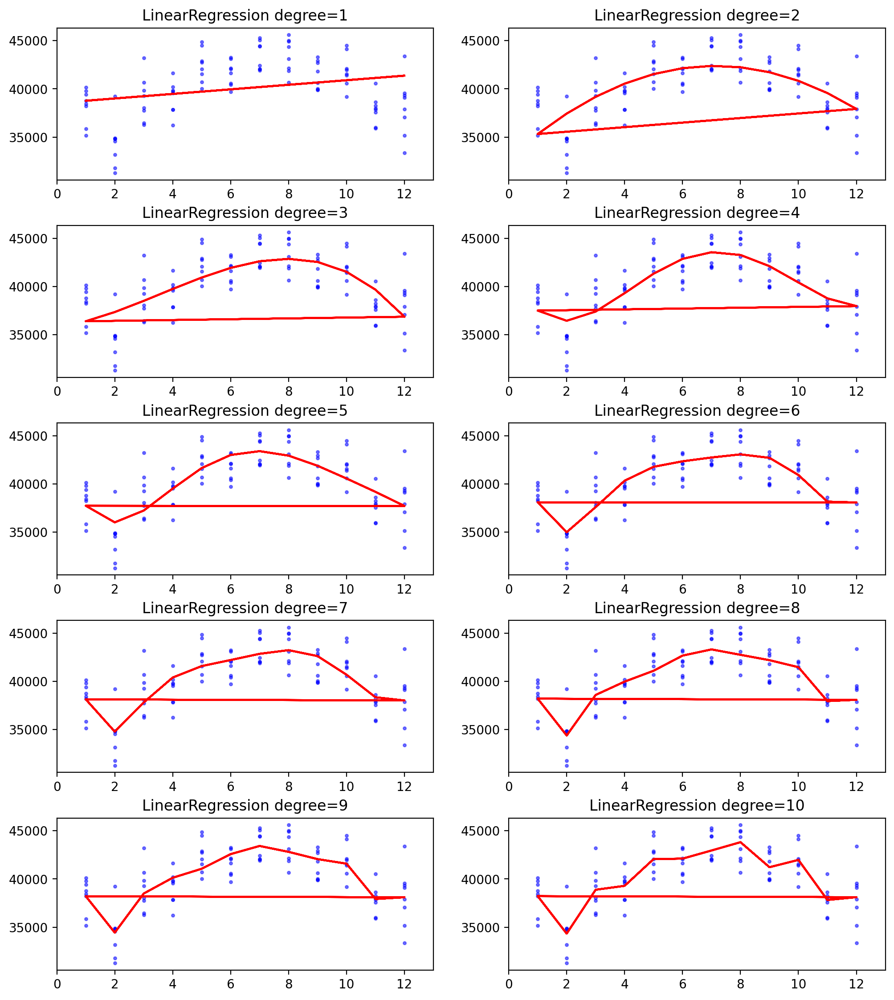

In [32]:
from matplotlib.figure import SubplotParams

plt.figure(figsize=(12, 14), dpi=200, subplotpars=SubplotParams(hspace=0.3))
for i, r in enumerate(results):
    fig = plt.subplot(5, 2, i+1)
    plt.xlim(0, 13)
    plt.title("LinearRegression degree={}".format(r["degree"]))
    plt.scatter(X, Y, s=5, c='b', alpha=0.5)
    plt.plot(X, r["model"].predict(X), 'r-')

__Draw a figure to visualize the scores with different degrees.__

In [33]:
find_degree=pd.DataFrame(columns={"degree": '',"score": ''})
find_degree['degree'] = degrees
find_degree['score'] = scores
find_degree

,degree,score
0,1,0.065580
1,2,0.452830
2,3,0.496976
3,4,0.570571
4,5,0.577663
5,6,0.617293
6,7,0.619688
7,8,0.642561
8,9,0.643335
9,10,0.677738


<AxesSubplot:xlabel='degree'>

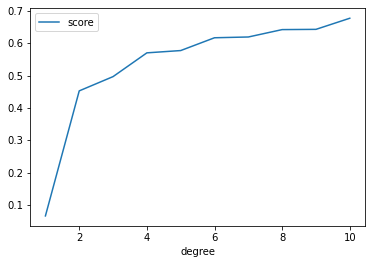

In [34]:
find_degree.plot('degree', 'score')

__Since that a high degree may cause overfitting, we select degree=6.__

__Let's get the prediction of 2020 with degree 6.__

In [35]:
X = np.asarray(crime_group_mon_df2['CMPLNT_MONTH'])
Y = np.asarray(crime_group_mon_df2['Number of Crime'])
X = X.reshape(-1, 1)
Y = Y.reshape(-1, 1)
x2020 = [1,2,3,4,5,6,7,8,9,10,11,12]
x2020 = np.asarray(x2020)
x2020 = x2020.reshape(-1, 1)
model = polynomial_model(degree=6)
model.fit(X, Y)
predict1 = model.predict(x2020)

df_predict1 = pd.DataFrame(columns={"Year2020": '', "Predict": ''})
df_predict1['Year2020'] = [1,2,3,4,5,6,7,8,9,10,11,12]
df_predict1['Predict'] = predict1
df_predict1

,Year2020,Predict
0,1,38093.359328
1,2,34994.544745
2,3,37598.049784
3,4,40332.958507
4,5,41775.122438
5,6,42347.341843
6,7,42741.893211
7,8,43065.402929
8,9,42706.067168
9,10,40923.217964


<AxesSubplot:xlabel='Year2020'>

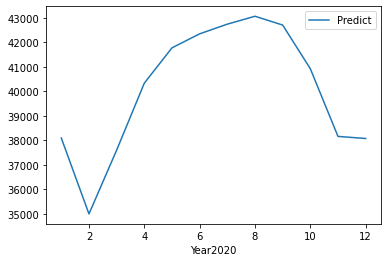

In [36]:
df_predict1.plot('Year2020', 'Predict')

__Next, we use only the recent 2 years data to build the model.__

In [37]:
crime_group_mon_df3=crime_group_mon_df2.loc[crime_group_mon_df2['CMPLNT_YEAR'] > 2017]
crime_group_mon_df3.reset_index(drop=True)

,CMPLNT_YEAR,CMPLNT_MONTH,Number of Crime
0,2018,1,38220
1,2018,2,34893
2,2018,3,37736
3,2018,4,37863
4,2018,5,41566
5,2018,6,40415
6,2018,7,42436
7,2018,8,42125
8,2018,9,40035
9,2018,10,40574


In [38]:
# convert the months to a continues array.
crime_group_mon_df3['mon_count'] = np.arange(1,25)
crime_group_mon_df3

<ipython-input-38-434c4f32c428>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_group_mon_df3['mon_count'] = np.arange(1,25)


,CMPLNT_YEAR,CMPLNT_MONTH,Number of Crime,mon_count
72,2018,1,38220,1
73,2018,2,34893,2
74,2018,3,37736,3
75,2018,4,37863,4
76,2018,5,41566,5
77,2018,6,40415,6
78,2018,7,42436,7
79,2018,8,42125,8
80,2018,9,40035,9
81,2018,10,40574,10


__Also, try different degrees__

In [39]:
X2 = np.asarray(crime_group_mon_df3['mon_count'])
Y2 = np.asarray(crime_group_mon_df3['Number of Crime'])
X2 = X2.reshape(-1, 1)
Y2 = Y2.reshape(-1, 1)

degrees2 = np.arange(1,11)
results2 = []
scores2 = []

for d in degrees2:
    model2 = polynomial_model(degree=d)
    model2.fit(X2, Y2)
    train_score2 = model2.score(X2, Y2)  #训练集上拟合的怎么样
    mse2 = mean_squared_error(Y2, model2.predict(X2))  #均方误差 cost
    results2.append({"model": model2, "degree": d, "score": train_score2, "mse": mse2})
    scores2.append(train_score2)
for r in results2:
    print("degree: {}; train score: {}; mean squared error: {}".format(r["degree"], r["score"], r["mse"]))

degree: 1; train score: 0.02194053919218486; mean squared error: 8307981.050066424
degree: 2; train score: 0.0936269458116682; mean squared error: 7699051.499658394
degree: 3; train score: 0.10250253935737164; mean squared error: 7623659.086476385
degree: 4; train score: 0.3478417727083193; mean squared error: 5539661.350966508
degree: 5; train score: 0.5637590319809547; mean squared error: 3705584.2111802027
degree: 6; train score: 0.6489015061015418; mean squared error: 2982354.0908300825
degree: 7; train score: 0.6646063110437589; mean squared error: 2848951.9541673847
degree: 8; train score: 0.6720684692960992; mean squared error: 2785565.757481719
degree: 9; train score: 0.7145118083580837; mean squared error: 2425037.107886866
degree: 10; train score: 0.7173964210916087; mean squared error: 2400534.1927909763


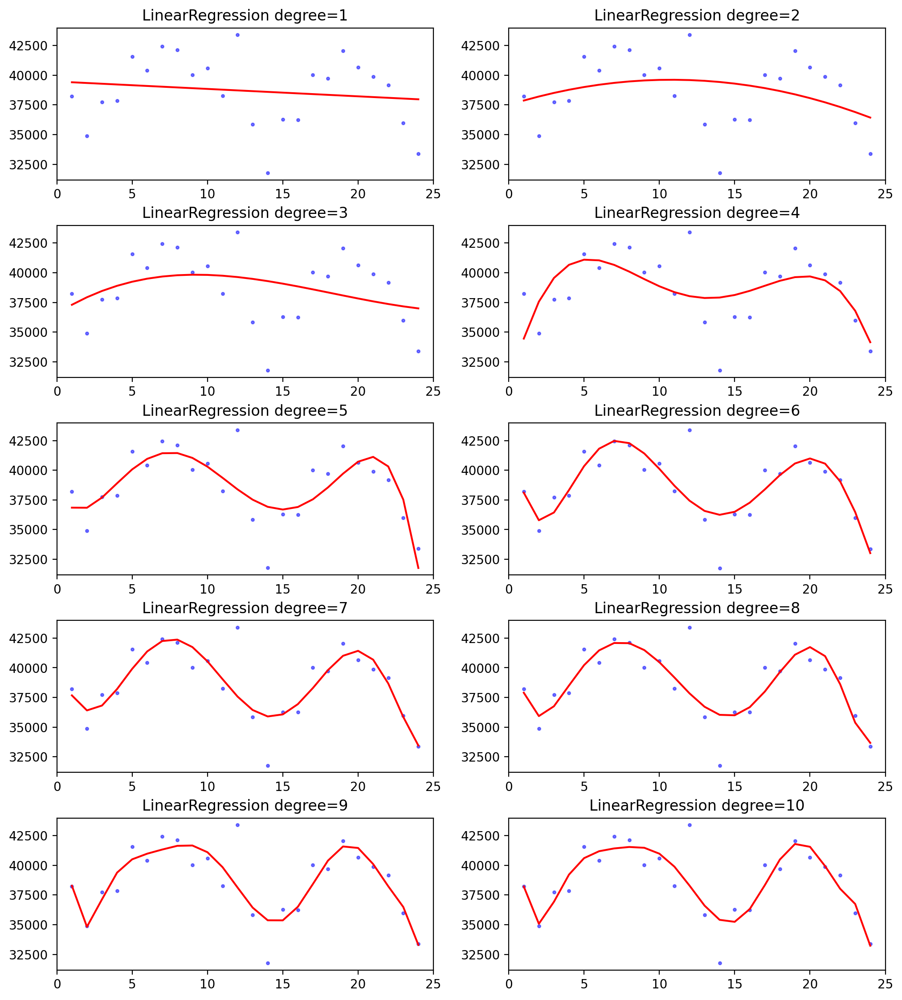

In [40]:
from matplotlib.figure import SubplotParams

plt.figure(figsize=(12, 14), dpi=200, subplotpars=SubplotParams(hspace=0.3))
for i, r in enumerate(results2):
    fig = plt.subplot(5, 2, i+1)
    plt.xlim(0, 25)
    plt.title("LinearRegression degree={}".format(r["degree"]))
    plt.scatter(X2, Y2, s=5, c='b', alpha=0.5)
    plt.plot(X2, r["model"].predict(X2), 'r-')

In [41]:
find_degree2=pd.DataFrame(columns={"degree": '',"score": ''})
find_degree2['degree'] = degrees2
find_degree2['score'] = scores2
find_degree2

,degree,score
0,1,0.021941
1,2,0.093627
2,3,0.102503
3,4,0.347842
4,5,0.563759
5,6,0.648902
6,7,0.664606
7,8,0.672068
8,9,0.714512
9,10,0.717396


<AxesSubplot:xlabel='degree'>

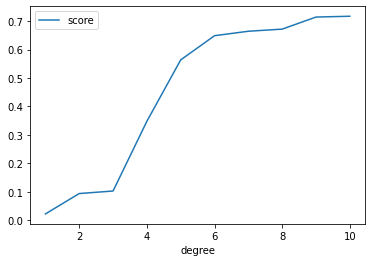

In [42]:
find_degree2.plot('degree', 'score')

__It is more obvious from this figure that degree 6 is propriate.__

__Get the prediction with degree 6.__

In [46]:
x2020_2 = [13,14,15,16,17,18,19,20,21,22,23,24]
x2020_2 = np.asarray(x2020_2)
x2020_2 = x2020_2.reshape(-1, 1)

model3 = polynomial_model(degree=6)
model3.fit(X2, Y2)
predict2 = model3.predict(x2020_2)

In [51]:
df_predict2 = pd.DataFrame(columns={"Year2020": '', "Predict": ''})
df_predict2['Year2020'] = [1,2,3,4,5,6,7,8,9,10,11,12]
df_predict2['Predict'] = predict2
df_predict2

,Year2020,Predict
0,1,36574.709937
1,2,36247.419442
2,3,36500.919691
3,4,37269.568385
4,5,38384.148948
5,6,39588.681988
6,7,40568.809189
7,8,40991.749621
8,9,40557.828469
9,10,39063.578189


<AxesSubplot:xlabel='Year2020'>

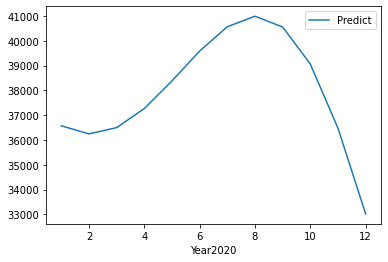

In [52]:
df_predict2.plot('Year2020', 'Predict')

__compare the 2 ways of prediction__

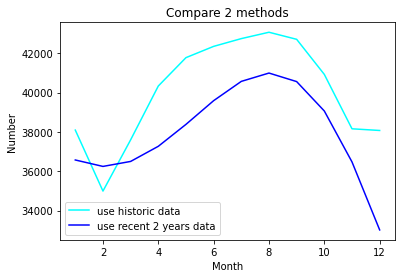

In [57]:
plt.title('Compare 2 methods')
plt.plot(df_predict1['Year2020'], df_predict1['Predict'], color='cyan', label='use historic data')
plt.plot(df_predict1['Year2020'], df_predict2['Predict'], 'b', label='use recent 2 years data')#'b'：color='blue'
plt.legend()  
plt.xlabel('Month')
plt.ylabel('Number')
plt.show()

__Apparently, the second prediction is lower than the first one. This is due to the crime number decreasing year by year. Thus, it is believed that the second prediction is more precise.__

---__Q5 ANSWER: We can use polynomial regression to predict the year 2020. However, there is no actual data to verify the accuracy of the prediction. Therefore, this prediction only gives us a general idea.__